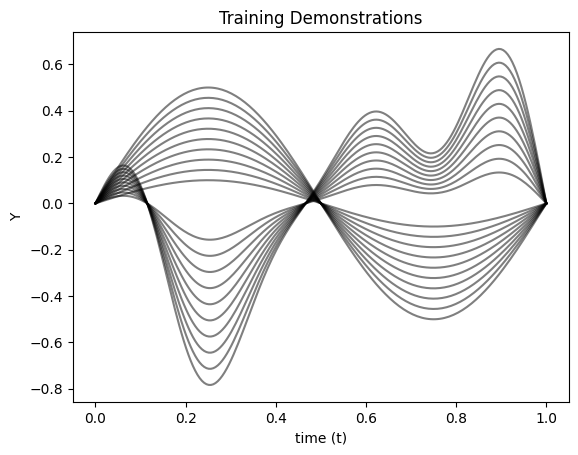

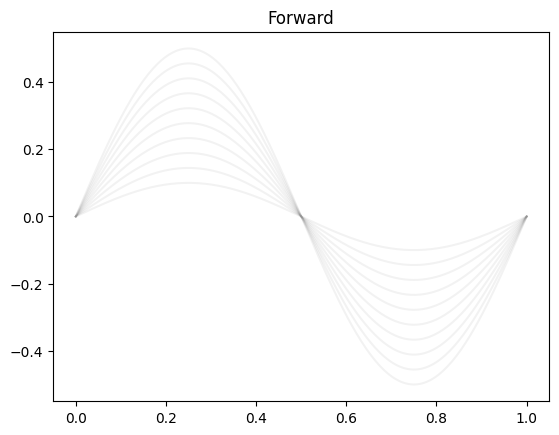

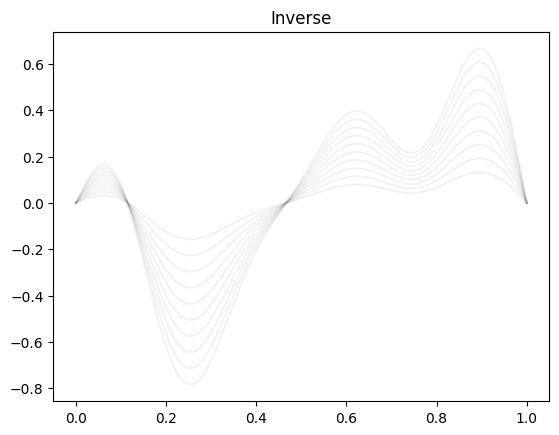

In [584]:
from cProfile import label
from re import X
from turtle import color
from sympy import li
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as D
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
import math
import importlib

import dual_enc_dec_cnmp as dual_enc_dec_cnmp
import utils
importlib.reload(dual_enc_dec_cnmp)
importlib.reload(utils)

#params = np.array([[2,0],[2,0],[2,0],[2,0],[2,0],[-0.6,0.1],[-0.55, 0.16],[-0.5,0.23],[-0.45, 0.33],[-0.4,0.43]])
params = np.array([[20],[19.9],[19.7]])

num_demo = 10
X1, X2, Y1, Y2, validation_Y1, validation_Y2 = utils.generate_demonstrations(num_demo, time_len=200, params = params, plot_title='Training')


In [586]:

valid_inverses = [True for i in range(10)]
#valid_inverses += [False for i in range(32)]

demo_data = [X1, X2, Y1, Y2]
d_x = 1
d_y1 = 1
d_y2 = 1
OBS_MAX = 20
d_N = num_demo
time_len = 200

validation_indices_1 = [i+1 for i in range(0, 10, 7)]
validation_indices_2 = [i+2 for i in range(0, 10, 7)]
validation_indices = validation_indices_1 + validation_indices_2

## convert to tensor, use sourceTensor.clone().detach() to get a new tensor
X1 = torch.tensor(X1, dtype=torch.float32)
X2 = torch.tensor(X2, dtype=torch.float32)
Y1 = torch.tensor(Y1, dtype=torch.float32)
Y2 = torch.tensor(Y2, dtype=torch.float32)
validation_Y1 = torch.tensor(validation_Y1, dtype=torch.float32)
validation_Y2 = torch.tensor(validation_Y2, dtype=torch.float32)



/var/folders/63/kw9gvntx3hzftcn6fp7wkf0c0000gn/T/ipykernel_42864/2794526032.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X1 = torch.tensor(X1, dtype=torch.float32)
/var/folders/63/kw9gvntx3hzftcn6fp7wkf0c0000gn/T/ipykernel_42864/2794526032.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X2 = torch.tensor(X2, dtype=torch.float32)
/var/folders/63/kw9gvntx3hzftcn6fp7wkf0c0000gn/T/ipykernel_42864/2794526032.py:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  Y1 = torch.tensor(Y1, dtype=torch.float32)
/var/folders/63/kw9gvntx3hzf

In [623]:
from ftplib import error_perm


importlib.reload(dual_enc_dec_cnmp)
importlib.reload(utils)


errors = []
losses = []
errors_with_latent = []


def train():

    model = dual_enc_dec_cnmp.DualEncoderDecoder(d_x, d_y1, d_y2)

    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    def lr_lambda(epoch):
        if epoch < 5000:
            return 1e-3 / optimizer.defaults['lr']  # Scale factor for 1e-3
        elif epoch < 13000:
            return 1e-4 / optimizer.defaults['lr']  # Scale factor for 1e-4
        elif epoch < 100000:
            return 1e-5 / optimizer.defaults['lr']  # Scale factor for 1e-5
        else:
            return 1e-6 / optimizer.defaults['lr']
    
    
    scheduler = optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)

    error = 0

    unpaired_traj = False
    
    for i in range(EPOCHS):

        if i == 0:
            unpaired_traj = True
    
        obs, mask, x_tar, y_tar_f, y_tar_i, traj_indices = dual_enc_dec_cnmp.get_training_sample(validation_indices, valid_inverses, unpaired_traj, X1, Y1, X2, Y2, OBS_MAX, d_N, d_x, d_y1, d_y2, time_len)
        optimizer.zero_grad()
        output, L_F, L_I = model(obs, mask, x_tar)

        loss = dual_enc_dec_cnmp.loss(output, y_tar_f, y_tar_i, d_y1, d_y2, L_F.squeeze(1), L_I.squeeze(1), valid_inverses, traj_indices)
        loss.backward()

        optimizer.step()
        scheduler.step()

        # VALIDATION
        if i % 100 == 0:
            #print(f"epoch {i}, loss: {loss.item()}")
            #utils.plot_latent_tsne(model, Y1, Y2, i)
            if i % 1000 == 0:
                losses.append(loss.item())
                
                # print(f'Epoch: {i}, Loss: {loss.item()}')
                error = 0
                plot_id = np.random.randint(0, len(validation_indices))
                for validation_idx in validation_indices:
                    time = np.linspace(0, 1, time_len)
                    # permute time
                    idx = np.random.permutation(time_len)
                    idx = idx[:10]
                    time = [time[i] for i in idx]
                    condition_points = [[t, Y1[validation_idx, i:i+1]] for t,i in zip(time, idx)]
                    means, stds = dual_enc_dec_cnmp.predict_inverse(model, validation_idx, time_len, condition_points, d_x, d_y1, d_y2, demo_data)
                    if i % 1000 == 0 and validation_idx == validation_indices[plot_id]:
                        error += utils.validate_model(means, stds, validation_idx, demo_data, time_len, condition_points, i, plot=True)
                    else:
                        error += utils.validate_model(means, stds, validation_idx, demo_data, time_len, condition_points, i, plot=False)

                    latent_loss = loss - dual_enc_dec_cnmp.log_prob_loss(output, y_tar_f, y_tar_i, d_y1, d_y2, valid_inverses, traj_indices)
                error_with_latent = error + latent_loss.item()
                errors_with_latent.append(error_with_latent)
                errors.append(error)
                if errors_with_latent[-1] == min(errors_with_latent):
                    print('Saving model ', i)
                    print('loss: ', loss.item())  
                    print('latent loss: ', latent_loss.item())  
                    torch.save(model.state_dict(), 'inverse_best_model.pth')


torch.Size([10, 200, 1])


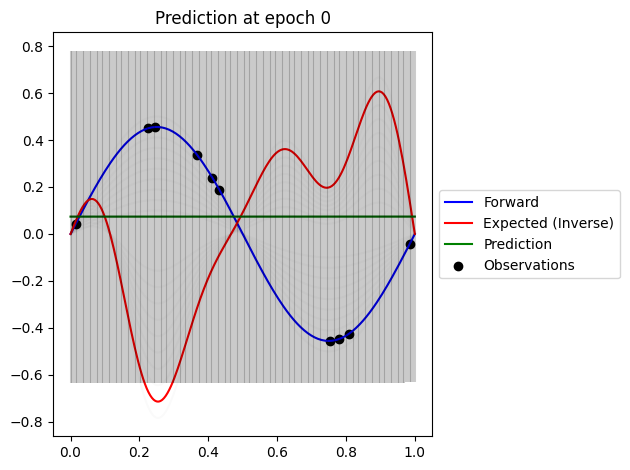

Saving model  0
loss:  11.35473346710205
latent loss:  10.125426292419434
torch.Size([10, 200, 1])


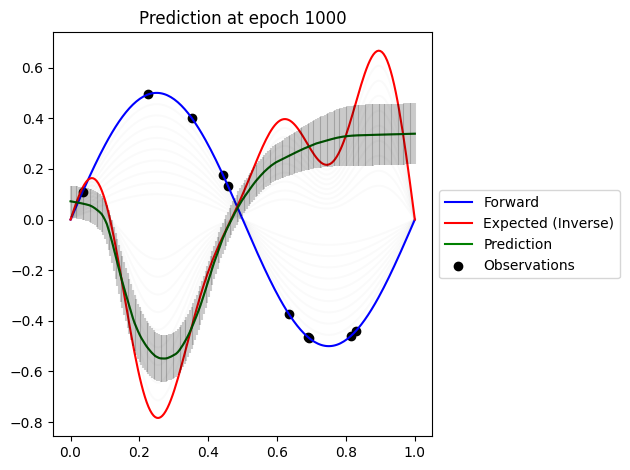

Saving model  1000
loss:  -2.38457989692688
latent loss:  0.3573644161224365
torch.Size([10, 200, 1])


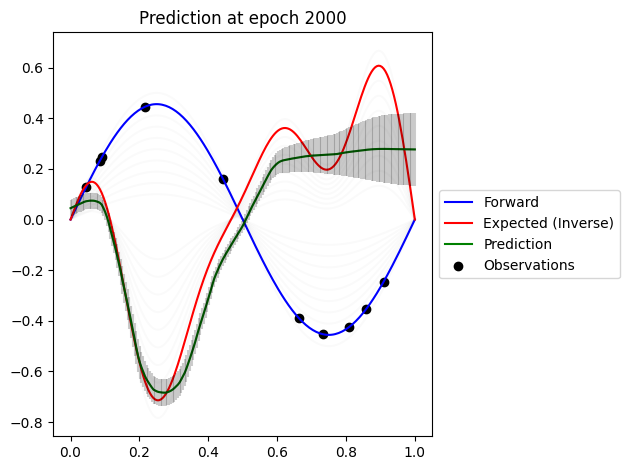

torch.Size([10, 200, 1])


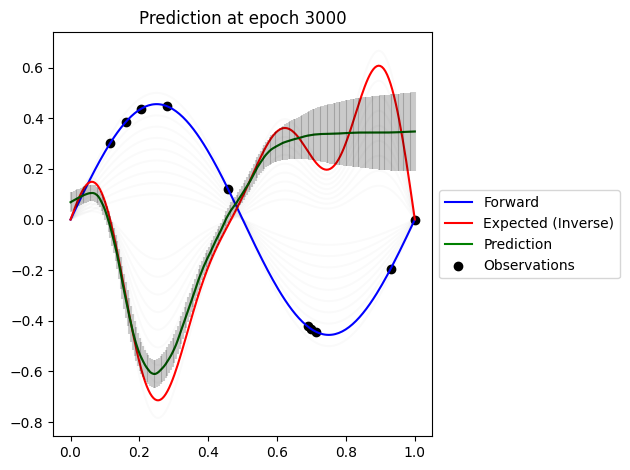

torch.Size([10, 200, 1])


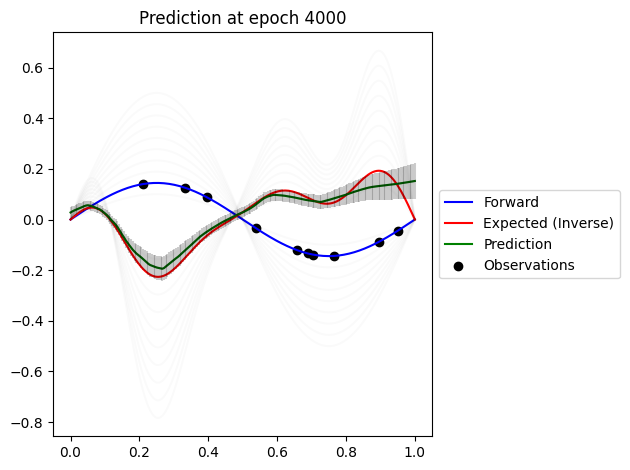

torch.Size([10, 200, 1])


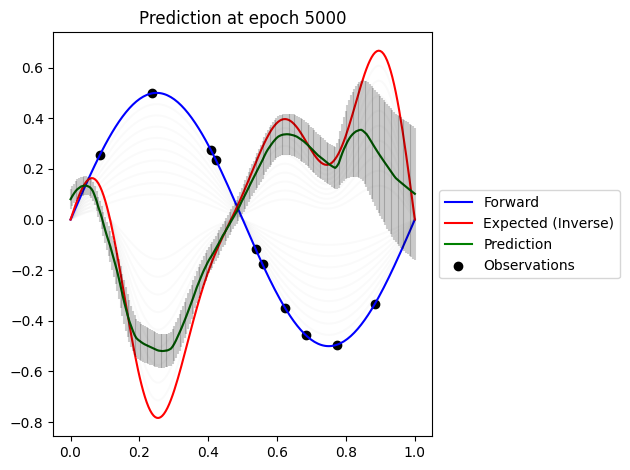

torch.Size([10, 200, 1])


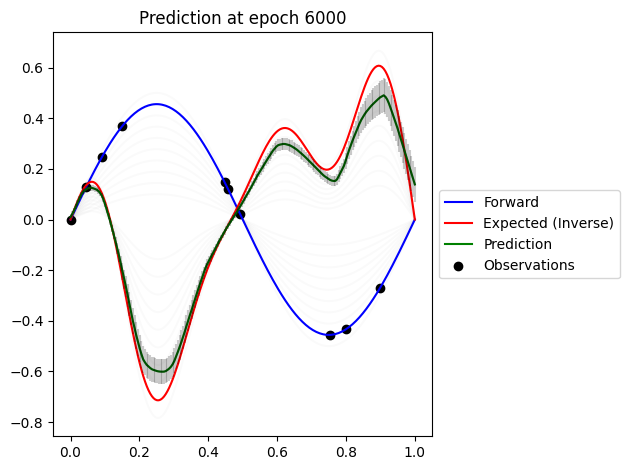

torch.Size([10, 200, 1])


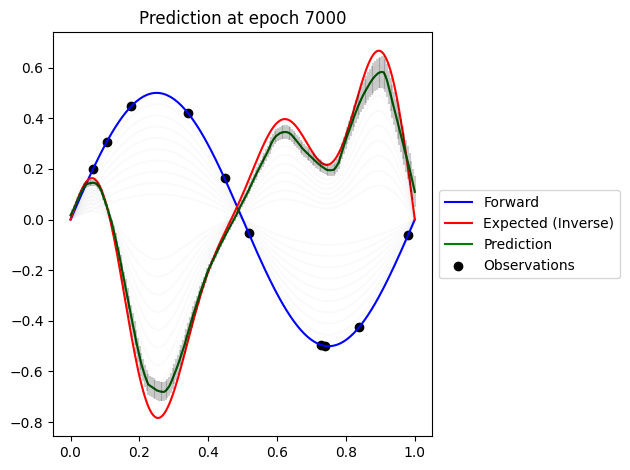

torch.Size([10, 200, 1])


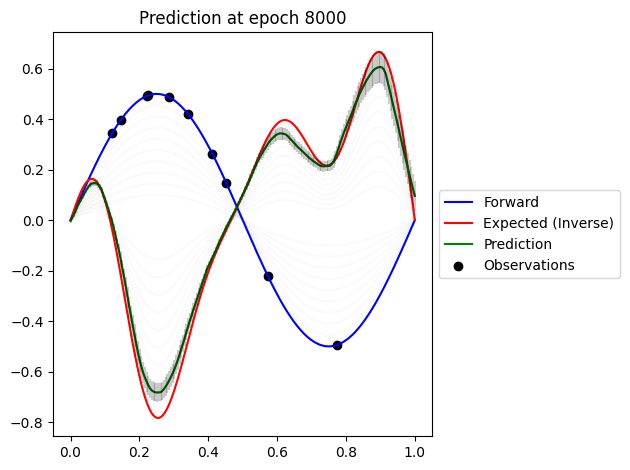

torch.Size([10, 200, 1])


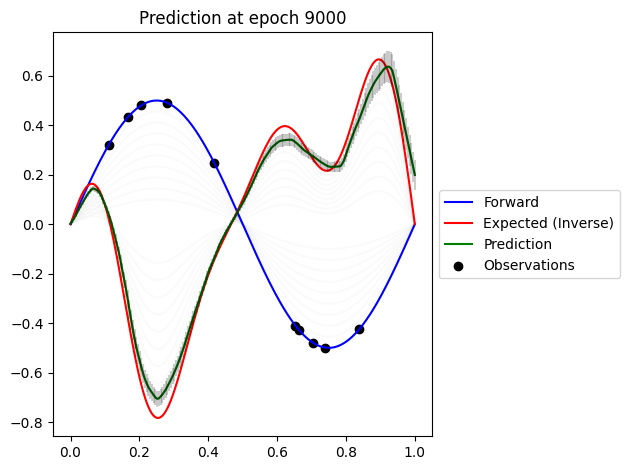

Saving model  9000
loss:  -6.193382263183594
latent loss:  0.06307458877563477
torch.Size([10, 200, 1])


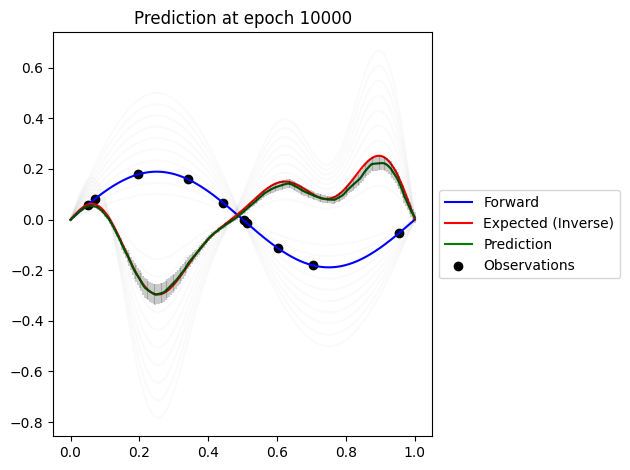

torch.Size([10, 200, 1])


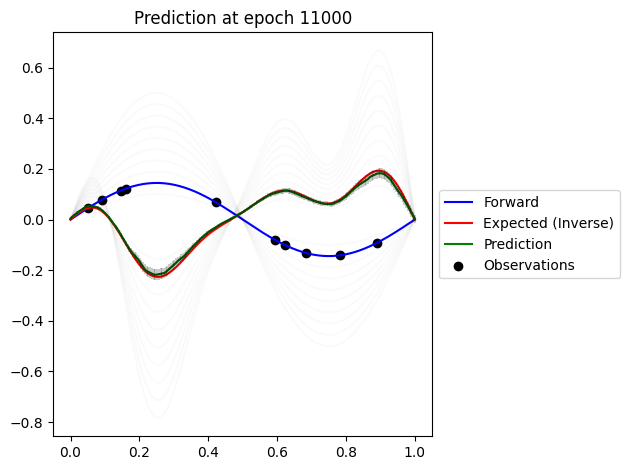

torch.Size([10, 200, 1])


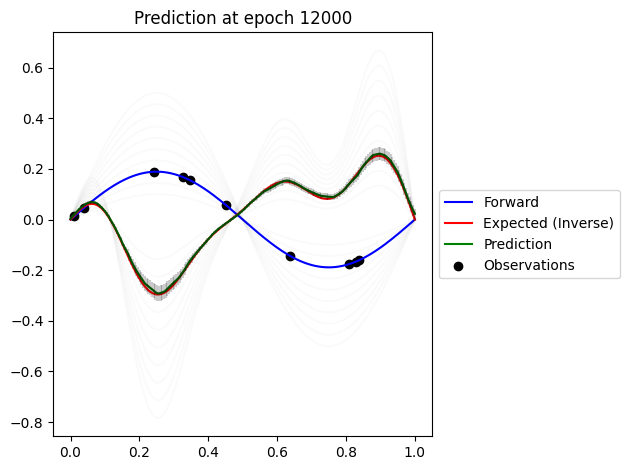

torch.Size([10, 200, 1])


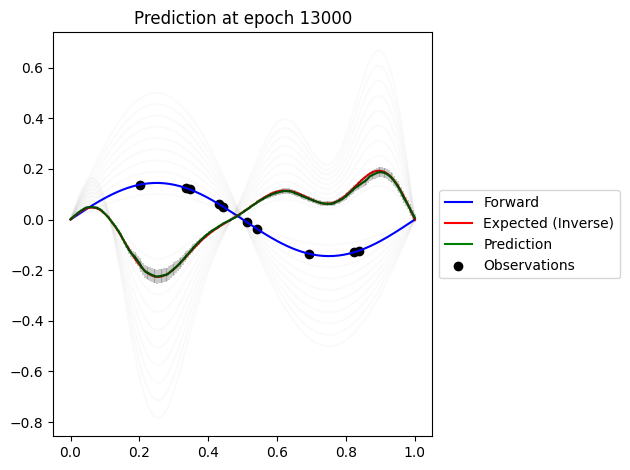

torch.Size([10, 200, 1])


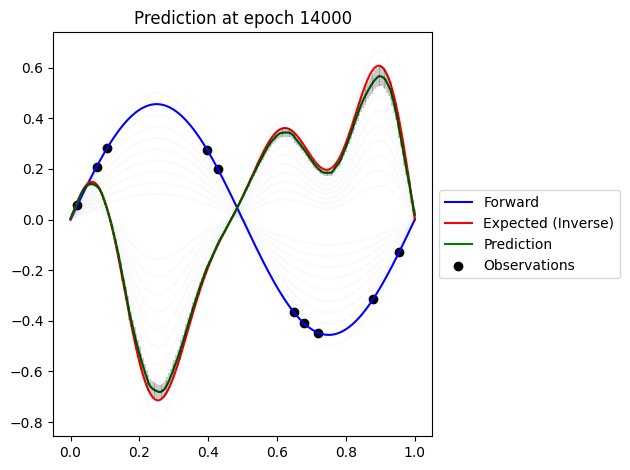

torch.Size([10, 200, 1])


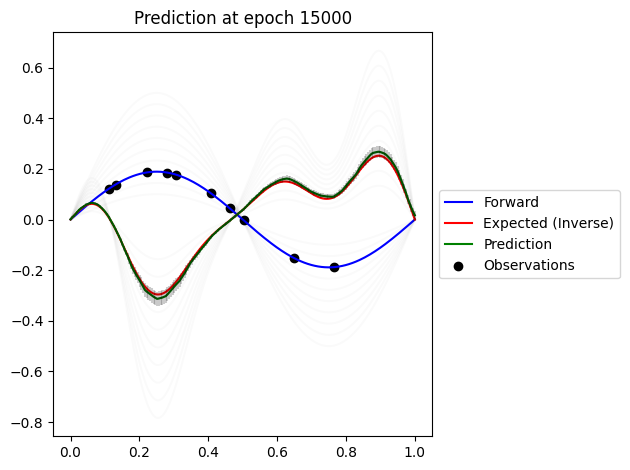

torch.Size([10, 200, 1])


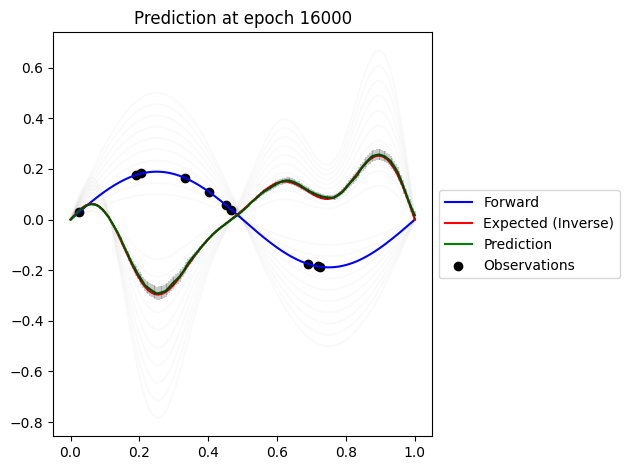

torch.Size([10, 200, 1])


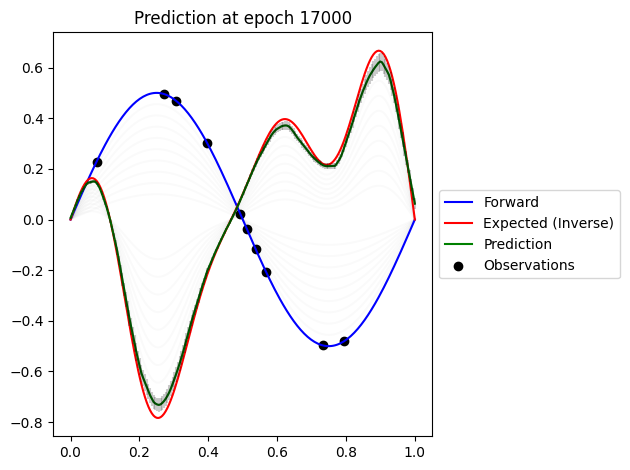

torch.Size([10, 200, 1])


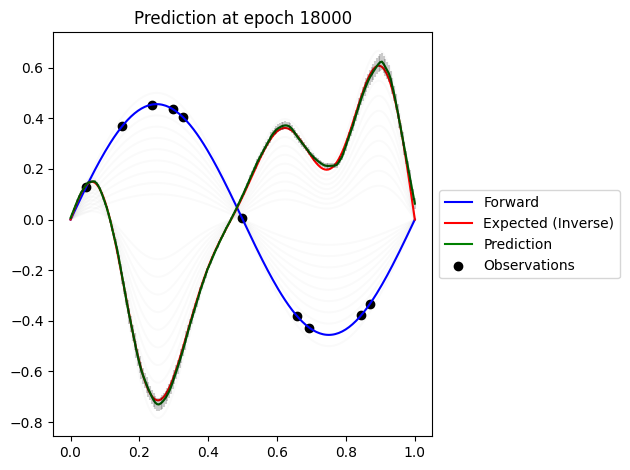

torch.Size([10, 200, 1])


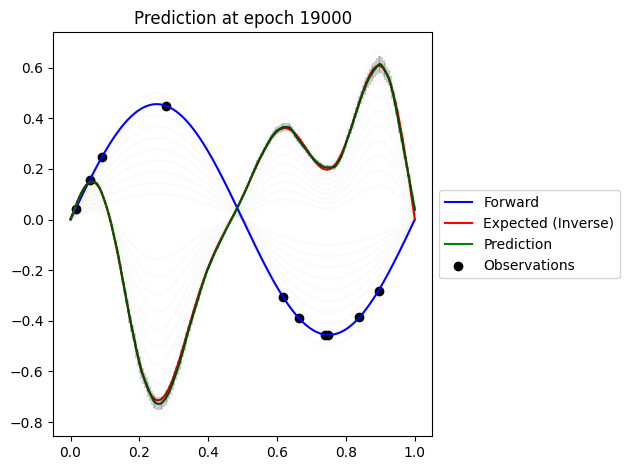

torch.Size([10, 200, 1])


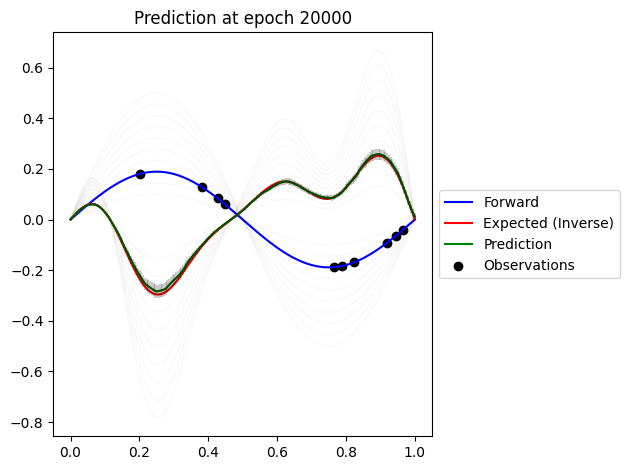

torch.Size([10, 200, 1])


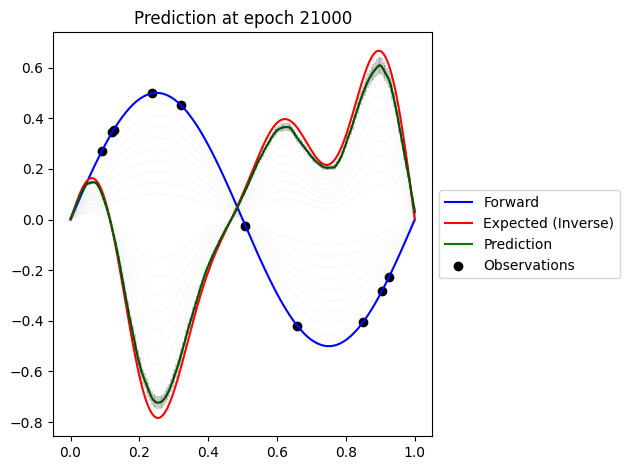

torch.Size([10, 200, 1])


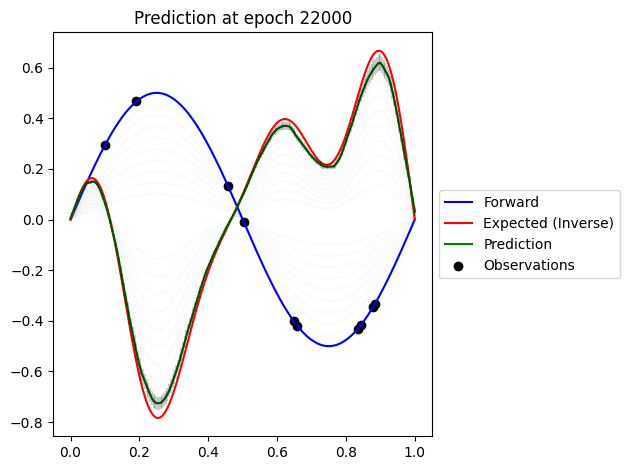

torch.Size([10, 200, 1])


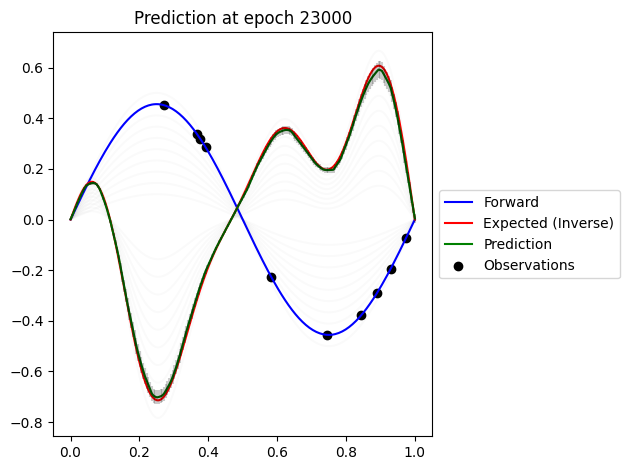

torch.Size([10, 200, 1])


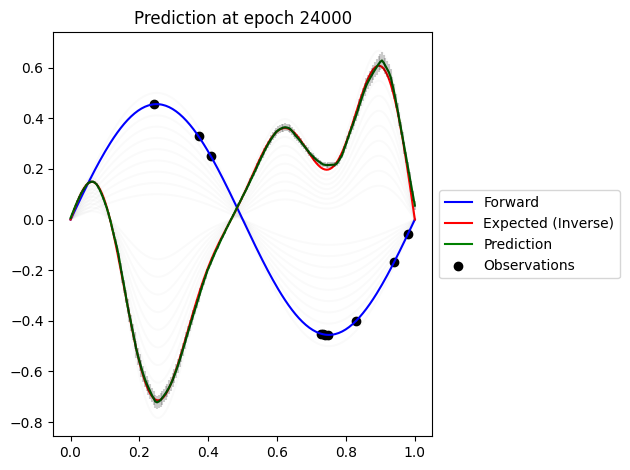

torch.Size([10, 200, 1])


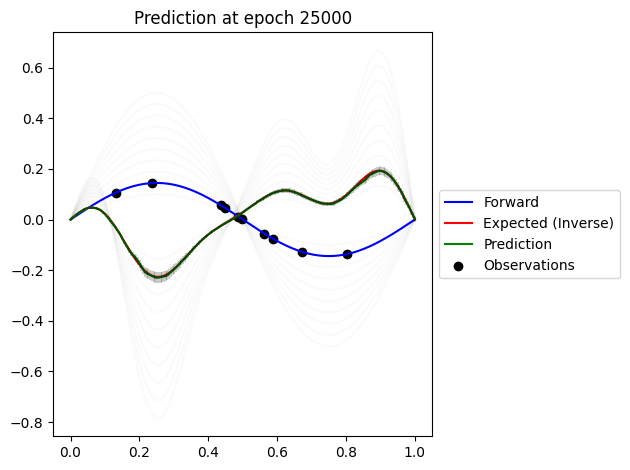

torch.Size([10, 200, 1])


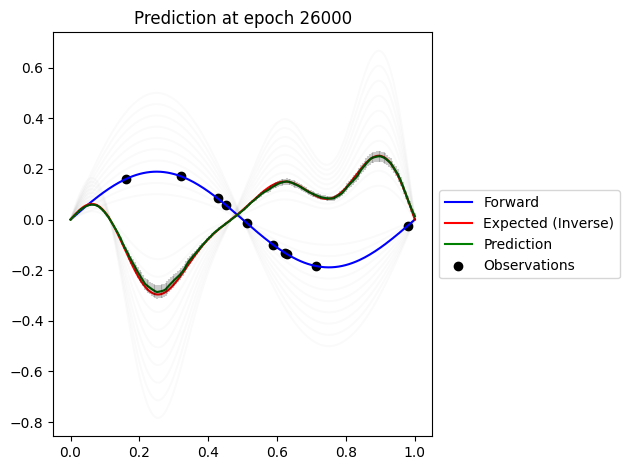

torch.Size([10, 200, 1])


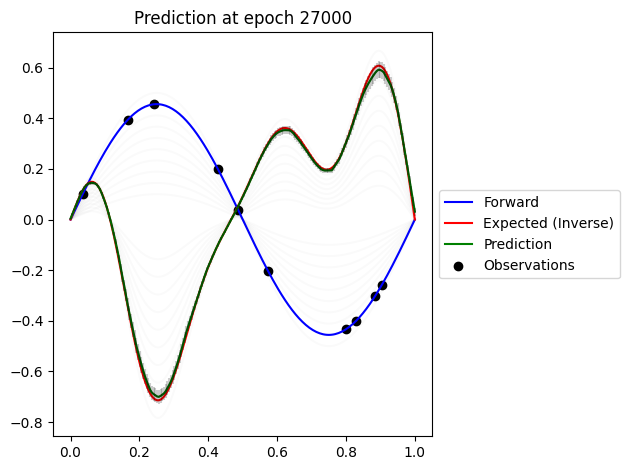

Saving model  27000
loss:  -6.640726089477539
latent loss:  0.03554391860961914
torch.Size([10, 200, 1])


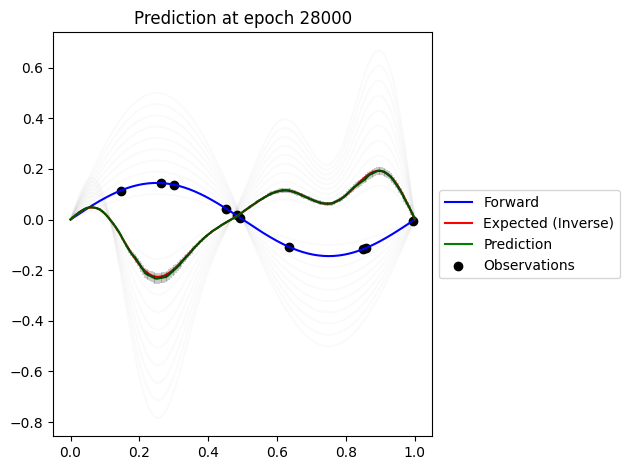

torch.Size([10, 200, 1])


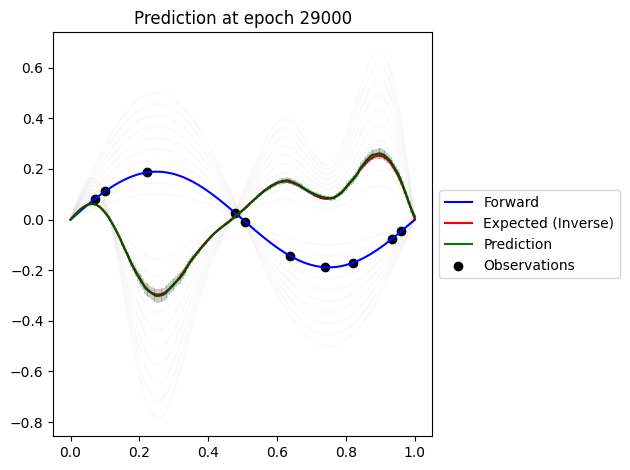

torch.Size([10, 200, 1])


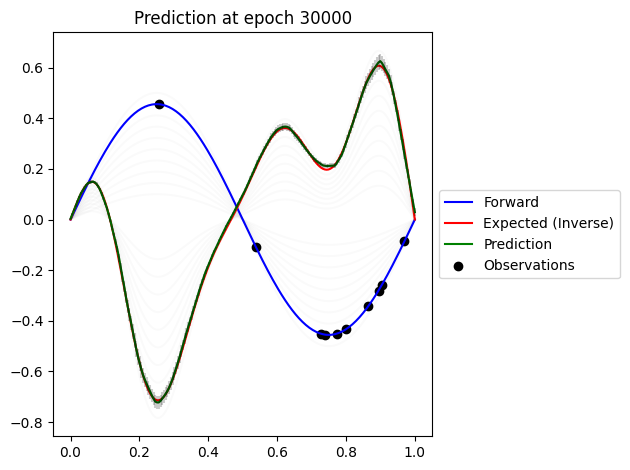

torch.Size([10, 200, 1])


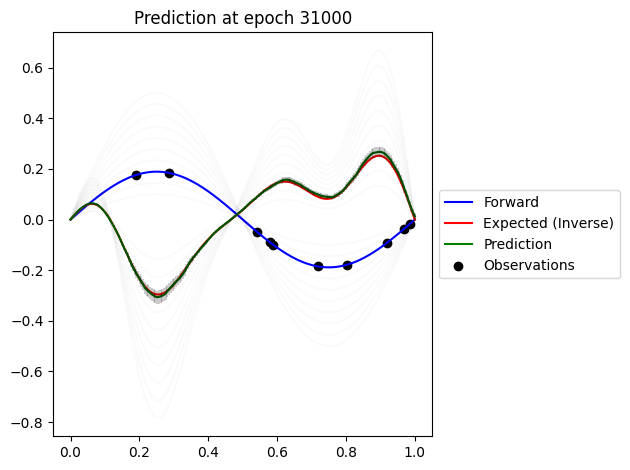

torch.Size([10, 200, 1])


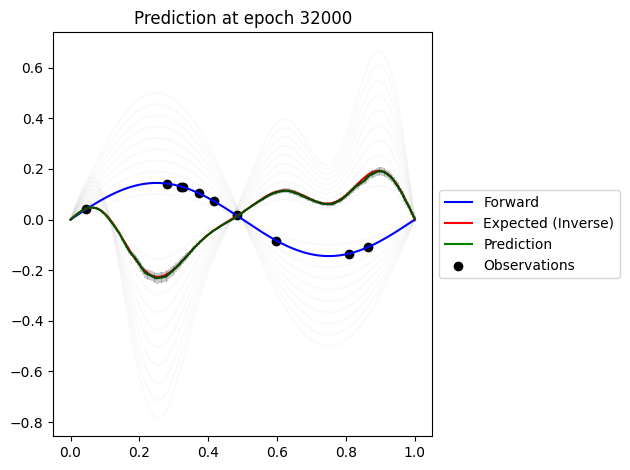

torch.Size([10, 200, 1])


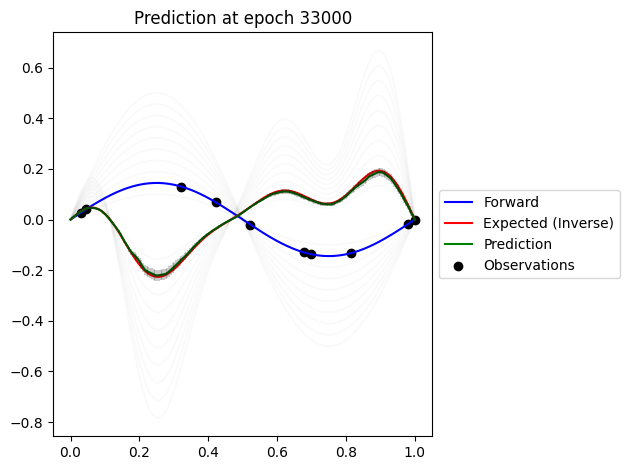

torch.Size([10, 200, 1])


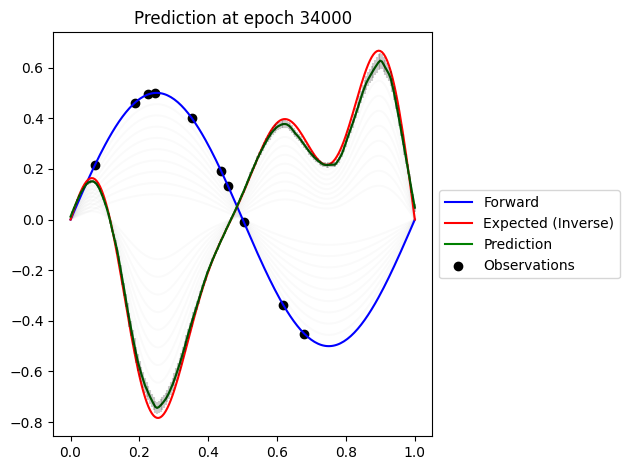

torch.Size([10, 200, 1])


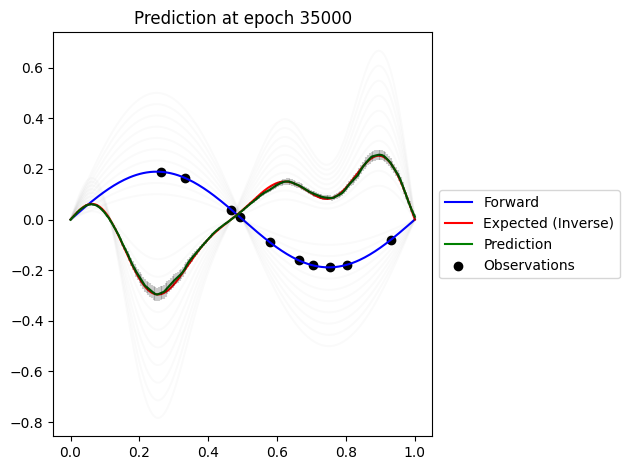

torch.Size([10, 200, 1])


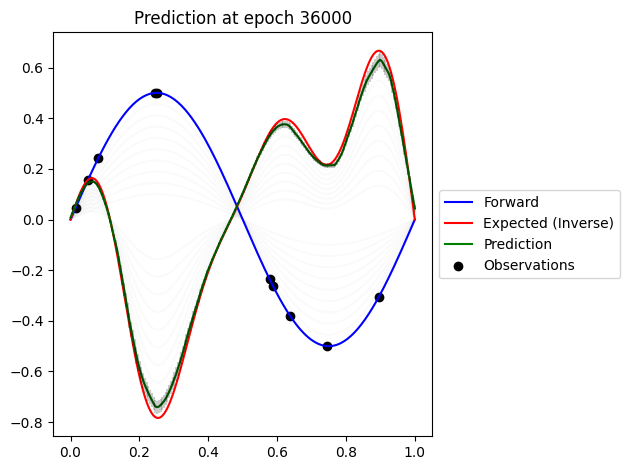

torch.Size([10, 200, 1])


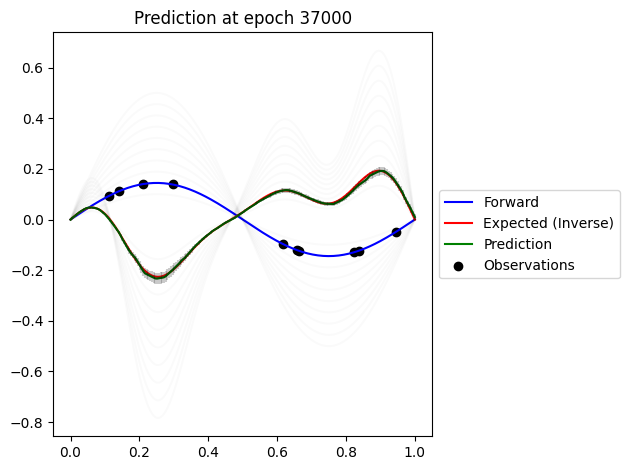

torch.Size([10, 200, 1])


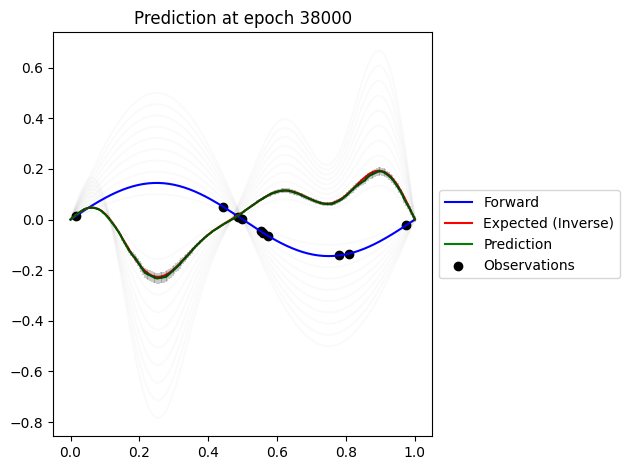

torch.Size([10, 200, 1])


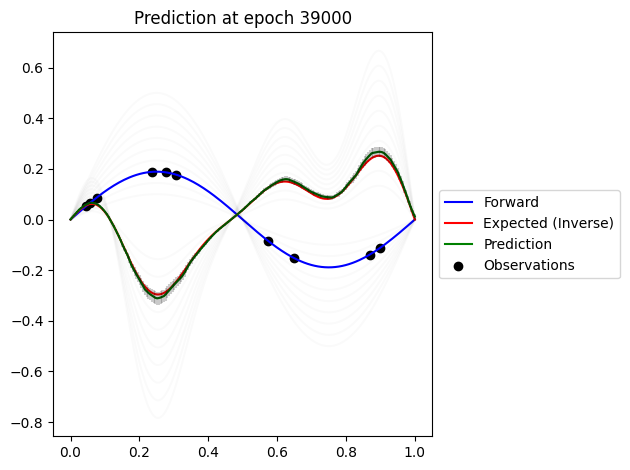

Saving model  39000
loss:  -6.938516616821289
latent loss:  0.030109882354736328
torch.Size([10, 200, 1])


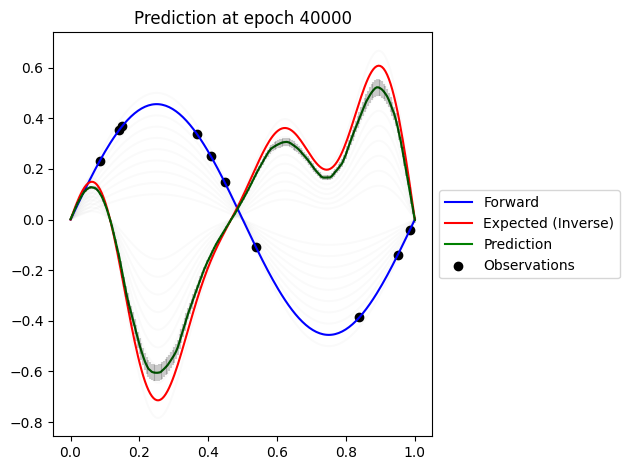

torch.Size([10, 200, 1])


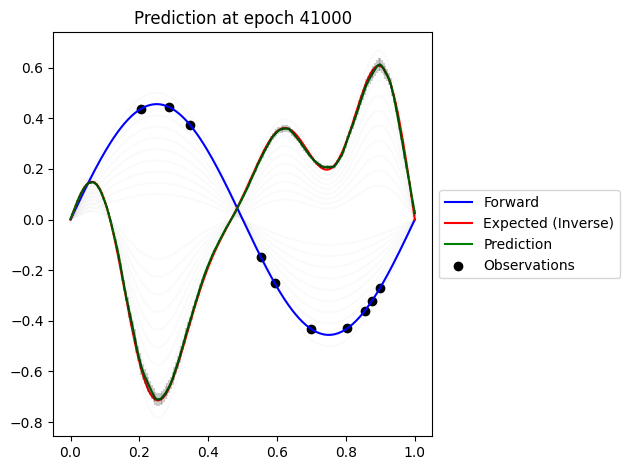

torch.Size([10, 200, 1])


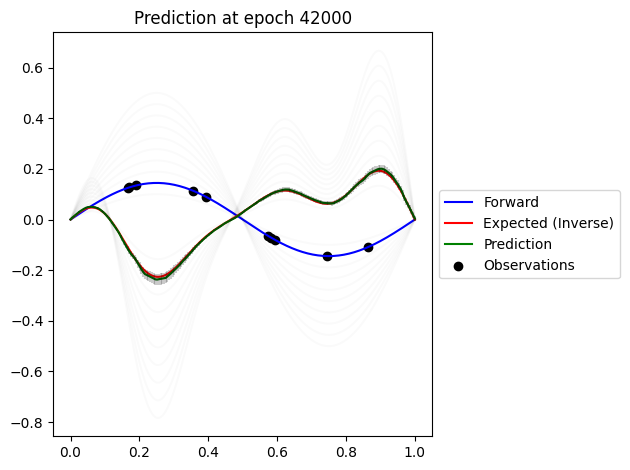

torch.Size([10, 200, 1])


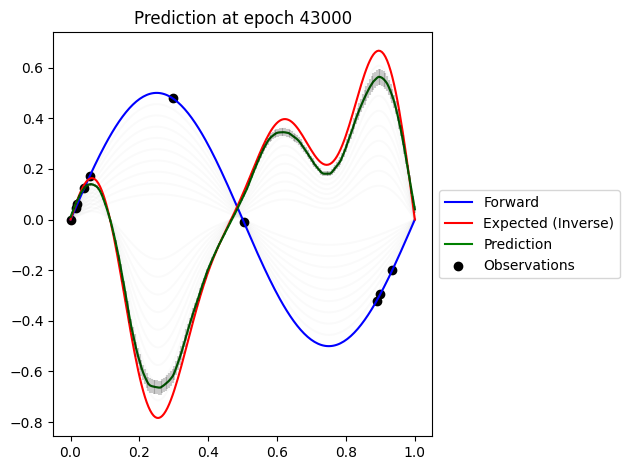

torch.Size([10, 200, 1])


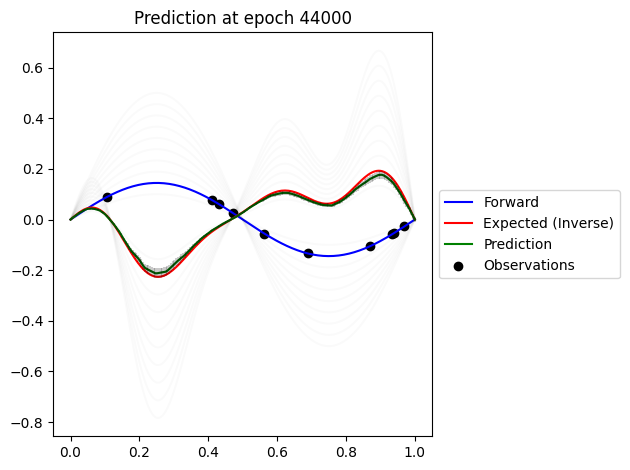

torch.Size([10, 200, 1])


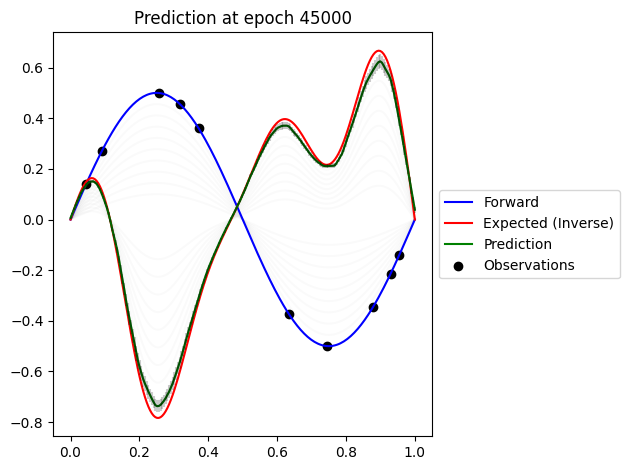

KeyboardInterrupt: 

In [624]:
importlib.reload(dual_enc_dec_cnmp)
importlib.reload(utils)

EPOCHS = 300000
learning_rate = 1e-4

train()

In [625]:
best_model = dual_enc_dec_cnmp.DualEncoderDecoder(d_x, d_y1, d_y2)
best_model.load_state_dict(torch.load('inverse_best_model.pth'))

/var/folders/63/kw9gvntx3hzftcn6fp7wkf0c0000gn/T/ipykernel_42864/1488616078.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model.load_state_dict(torch.load('invers

<All keys matched successfully>

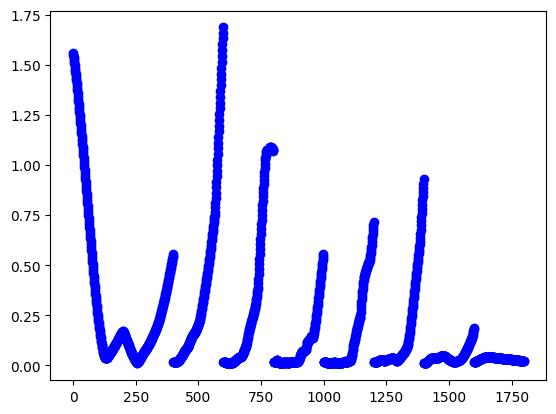

(3600, 1, 32)
(3600, 2)


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (4,) + inhomogeneous part.

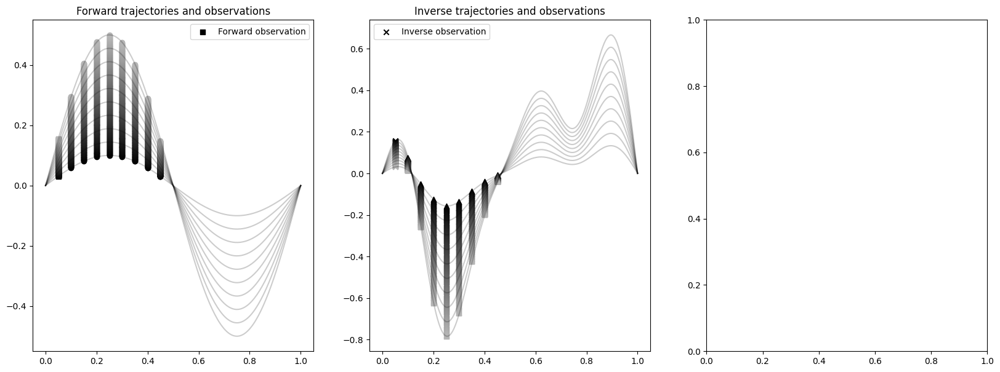

In [ ]:

importlib.reload(dual_enc_dec_cnmp)
importlib.reload(utils)
from mpl_toolkits.mplot3d import Axes3D
from sympy import intervals


time = [0.1, 0.25]

## do the same for t = 0.25 and t = 0.75, obtain the pca result for all the points

intervals_y_f = []
intervals_y_i = []

all_observations_f = []  
all_observations_i = []

NUM_STEP = 200

for t in time:
    min_y_f = torch.min(Y1[:, int(t * time_len)])
    max_y_f = torch.max(Y1[:, int(t * time_len)])
    interval_y_f = torch.linspace(min_y_f, max_y_f, NUM_STEP)
    if t > 0.5:
        interval_y_f = torch.flip(interval_y_f, dims=[0])
    intervals_y_f.append(interval_y_f)

    min_y_i = torch.min(Y2[:, int(t * time_len)])
    max_y_i = torch.max(Y2[:, int(t * time_len)])
    interval_y_i = torch.linspace(min_y_i, max_y_i, NUM_STEP)
    if t < 0.5:
        interval_y_i = torch.flip(interval_y_i, dims=[0])
    intervals_y_i.append(interval_y_i)

    for idx in interval_y_f:
        condition_points = [[t, idx]]
        all_observations_f.append(condition_points)
    for idx in interval_y_i:
        condition_points = [[t, idx]]
        all_observations_i.append(condition_points)

all_observations_f = torch.tensor(all_observations_f)
all_observations_i = torch.tensor(all_observations_i)


pca_result = dual_enc_dec_cnmp.plot_latent_space(best_model, all_observations_f, all_observations_i) # [ft0, ft1, ... , it0, it1, ...]

## open 2 subplots
fig, axs = plt.subplots(1, 3, figsize=(20, 7))


for forward_traj in Y1:
    axs[0].plot(torch.linspace(0, 1, time_len), forward_traj, c='black', alpha=0.2)
for inverse_traj in Y2:
    axs[1].plot(torch.linspace(0, 1, time_len), inverse_traj, c='black', alpha=0.2)
axs[0].set_title("Forward trajectories and observations")
axs[1].set_title("Inverse trajectories and observations")

for i in range(len(intervals_y_f)):
    for j in range(len(intervals_y_f[i])):
        if i == 0 and j == 0:
            axs[0].scatter(time[i], intervals_y_f[i][j], marker="s", c=f"{(j)/(1.4*len(interval_y_f))}", label='Forward observation')
        else:
            if i == 0:
                axs[0].scatter(time[i], intervals_y_f[i][j], marker="s", c=f"{(j)/(1.4*len(interval_y_f))}")
            else:
                axs[0].scatter(time[i], intervals_y_f[i][j], c=f"{(j)/(1.4*len(interval_y_f))}")

for i in range(len(intervals_y_i)):
    for j in range(len(intervals_y_i[i])):
        if i == 0 and j == 0:
            axs[1].scatter(time[i], intervals_y_i[i][j], marker="x", c=f"{(j)/(1.4*len(interval_y_i))}", label='Inverse observation')
        else:
            if i == 0:
                axs[1].scatter(time[i], intervals_y_i[i][j], marker="x", c=f"{(j)/(1.4*len(interval_y_i))}")
            else:
                axs[1].scatter(time[i], intervals_y_i[i][j], marker="^", c=f"{(j)/(1.4*len(interval_y_i))}")

axs[0].legend()
axs[1].legend()

print(pca_result.shape)
pca_result = np.array(pca_result)
pca_result_f1, pca_result_f2, pca_result_i1, pca_result_i2 = pca_result[:NUM_STEP], pca_result[NUM_STEP:NUM_STEP*2], pca_result[NUM_STEP*2:NUM_STEP*3], pca_result[NUM_STEP*3:]

pca_result = np.array([pca_result_f1, pca_result_f2, pca_result_i1, pca_result_i2])

dict_markers = {0:'s', 1:'o', 2:'x', 3:'^'}

for i in range(4):
    for j in range(NUM_STEP):
        if j < 3*NUM_STEP/4:
            axs[2].scatter(pca_result[i, j, 0], pca_result[i, j, 1], marker=dict_markers[i], c=f"{(j)/(1.4*NUM_STEP)}")
        else:
            axs[2].scatter(pca_result[i, j, 0], pca_result[i, j, 1], marker=dict_markers[i], c="b")
    axs[2].set_title("PCA Analysis of the latent space of a single observations")

axs[2].axis('equal')
    
## make x and y axis equal

plt.title("PCA Analysis of the latent space of a single observations")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()



0


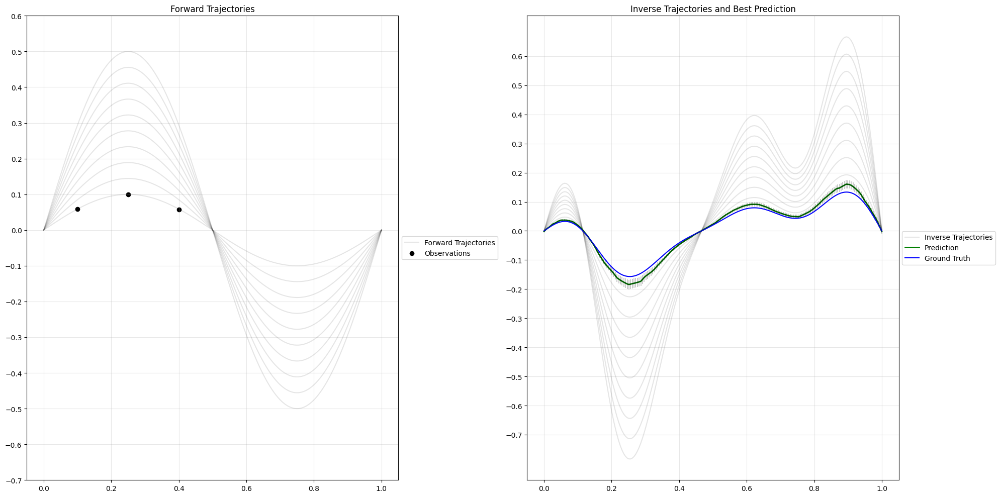

1


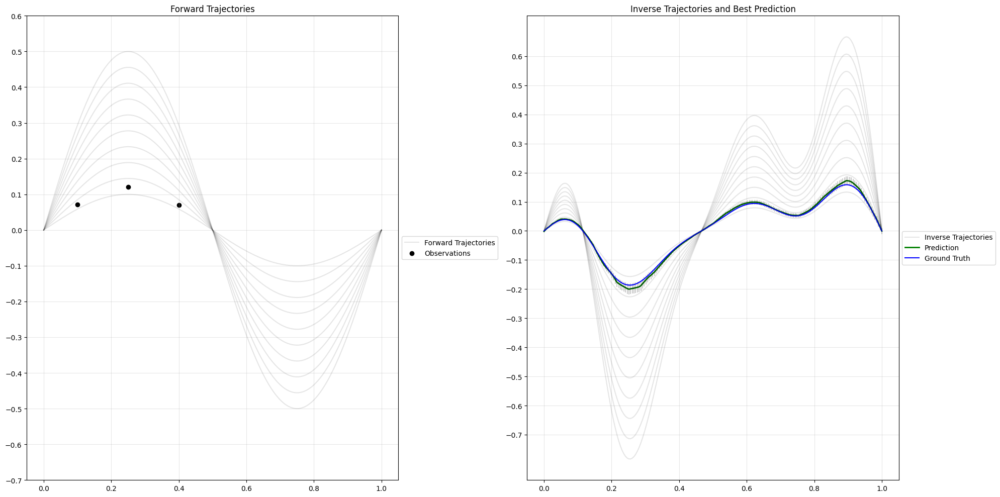

2


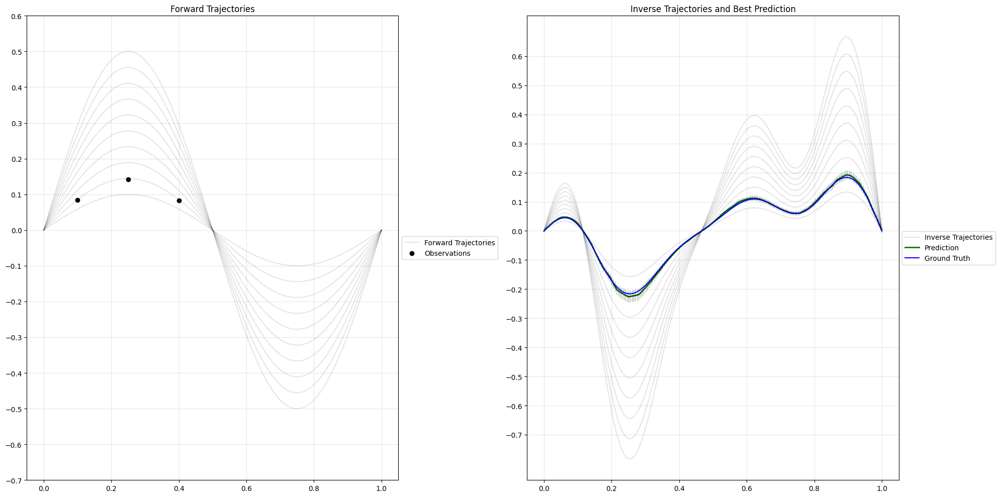

3


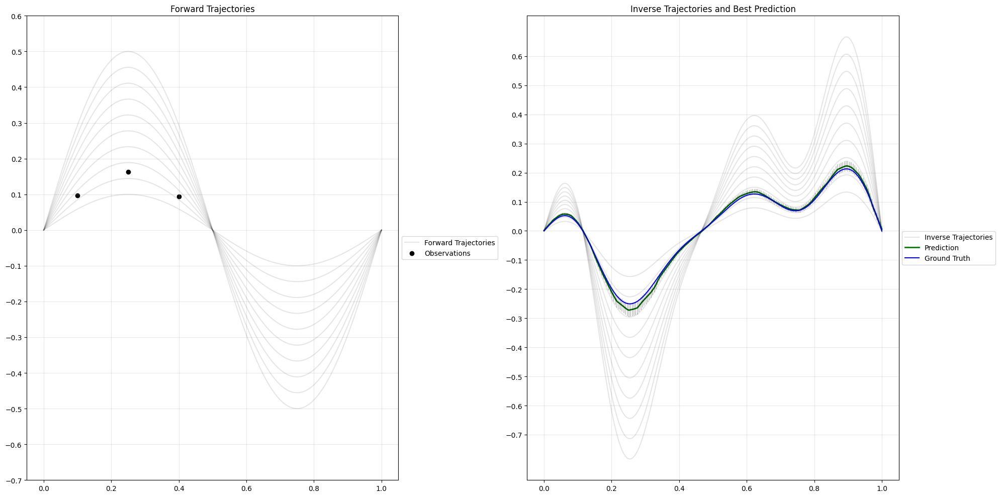

4


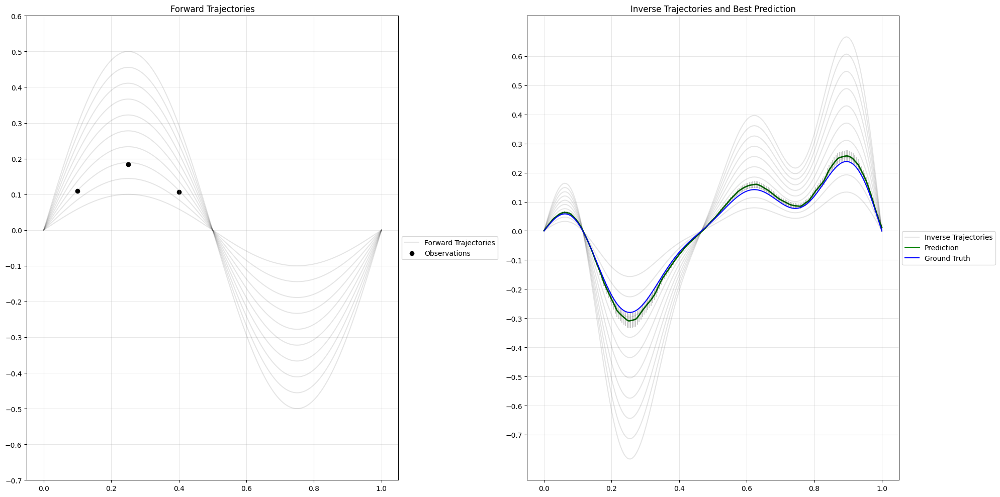

5


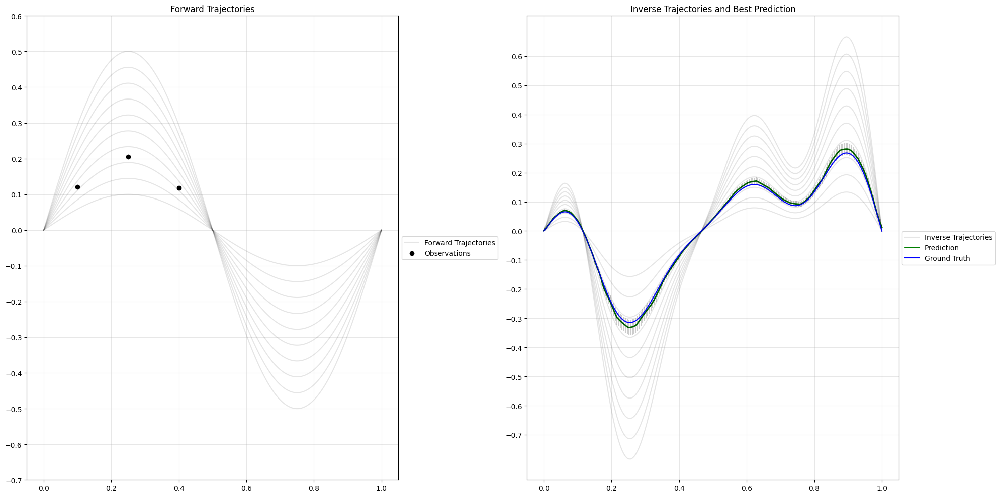

6


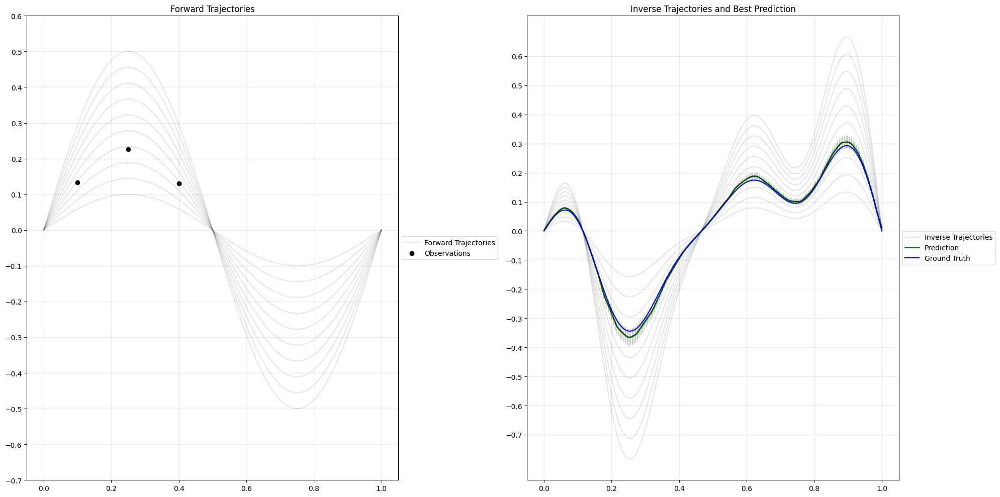

7


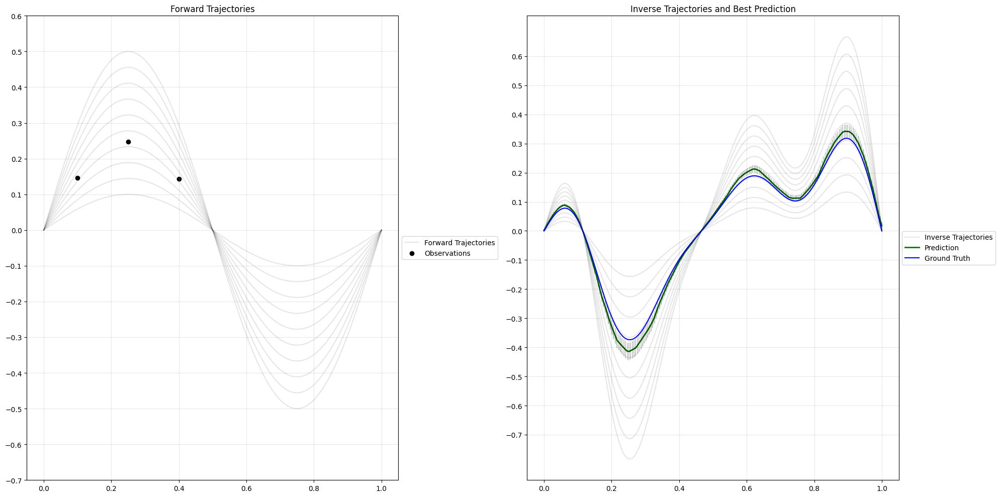

8


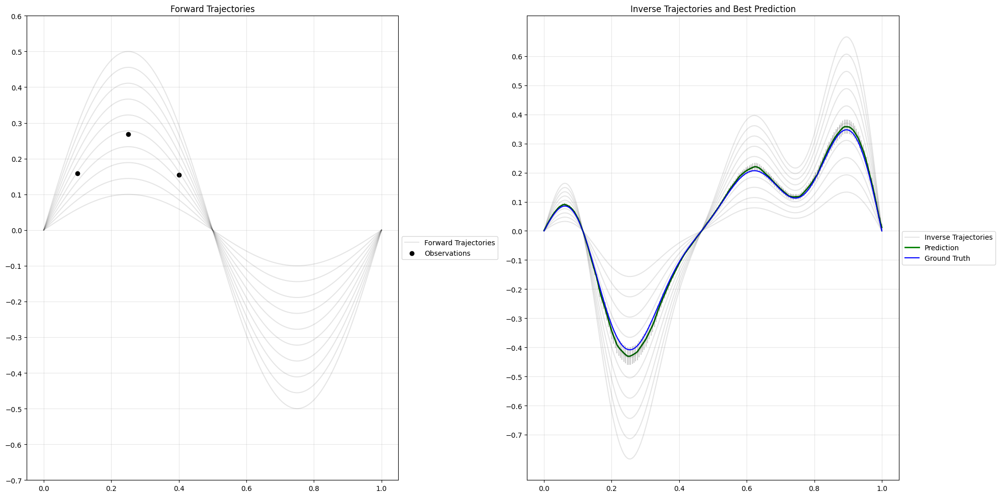

9


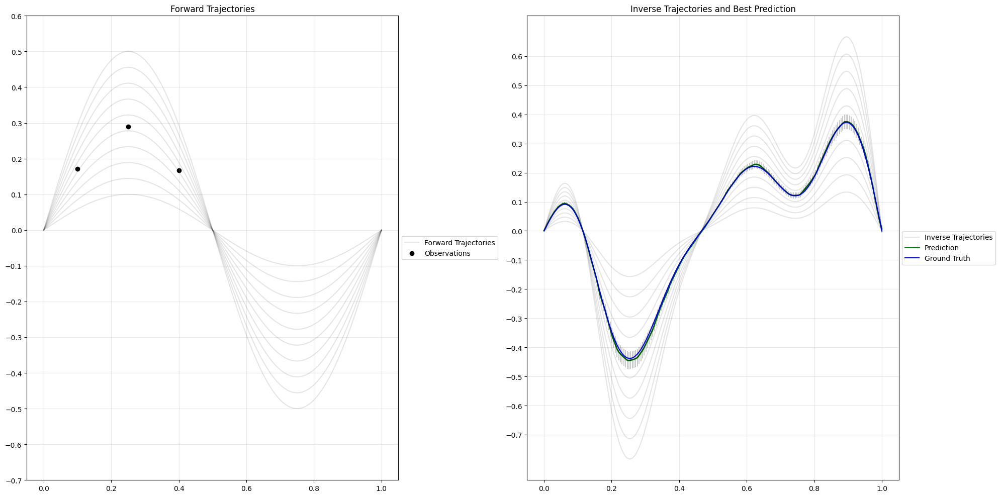

10


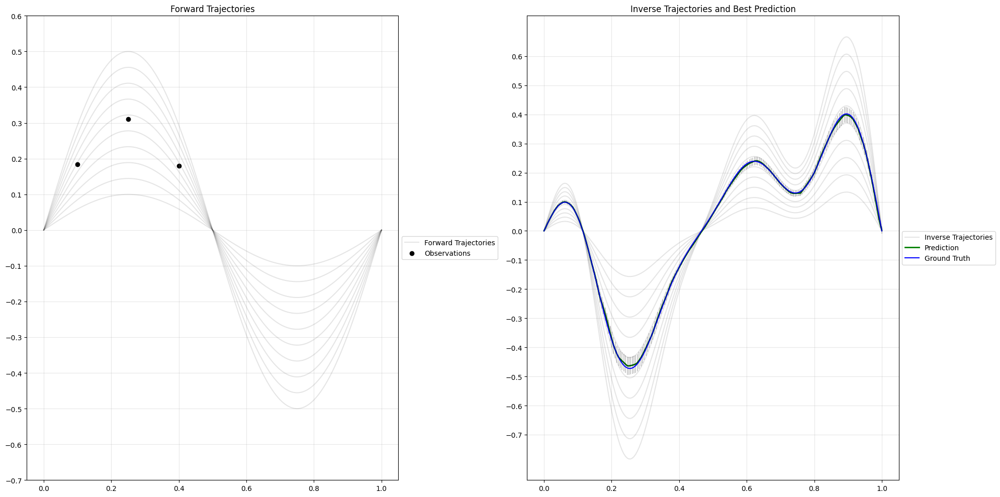

11


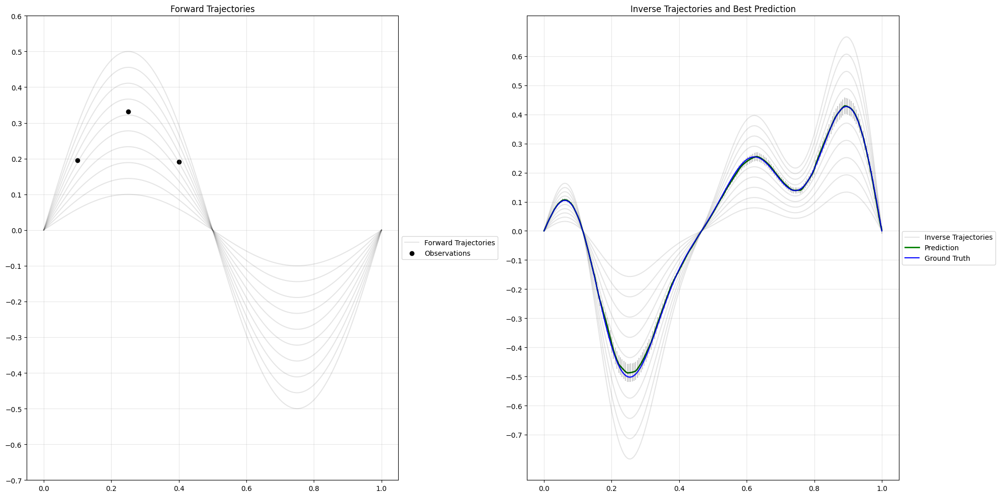

12


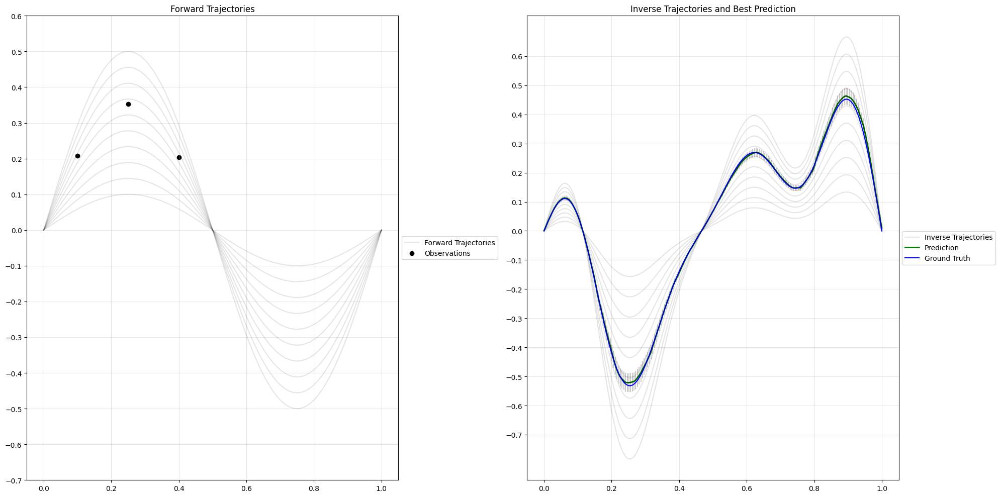

13


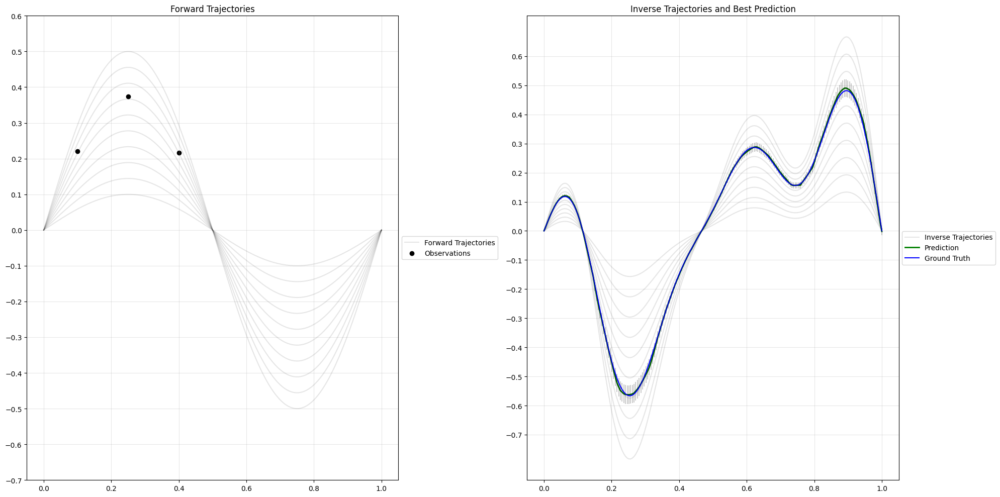

14


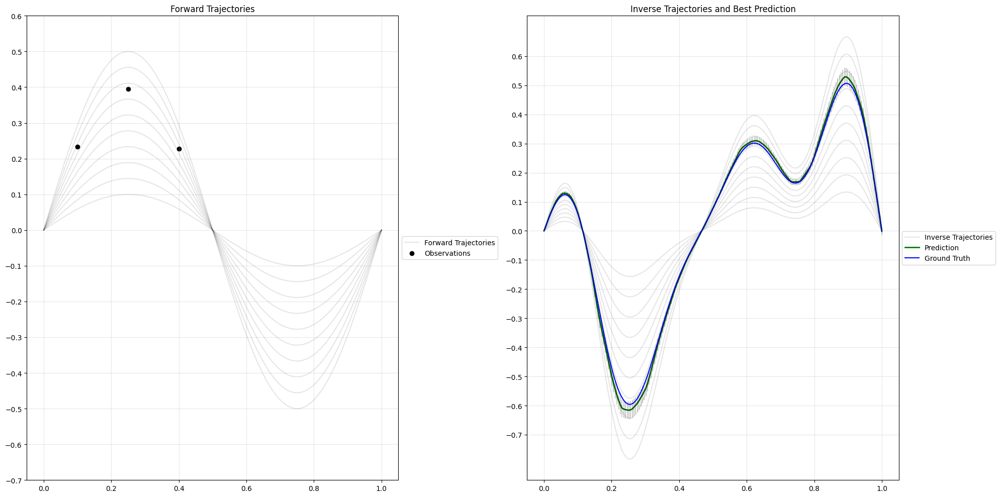

15


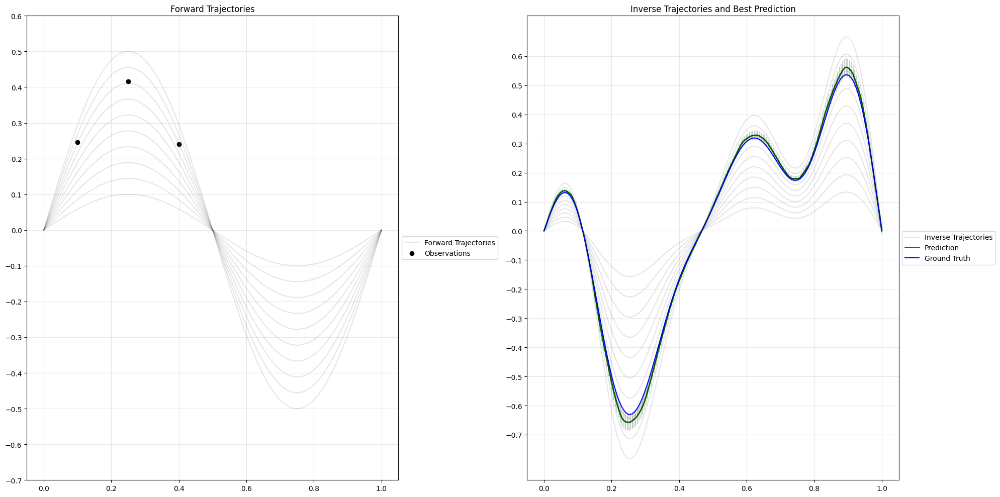

16


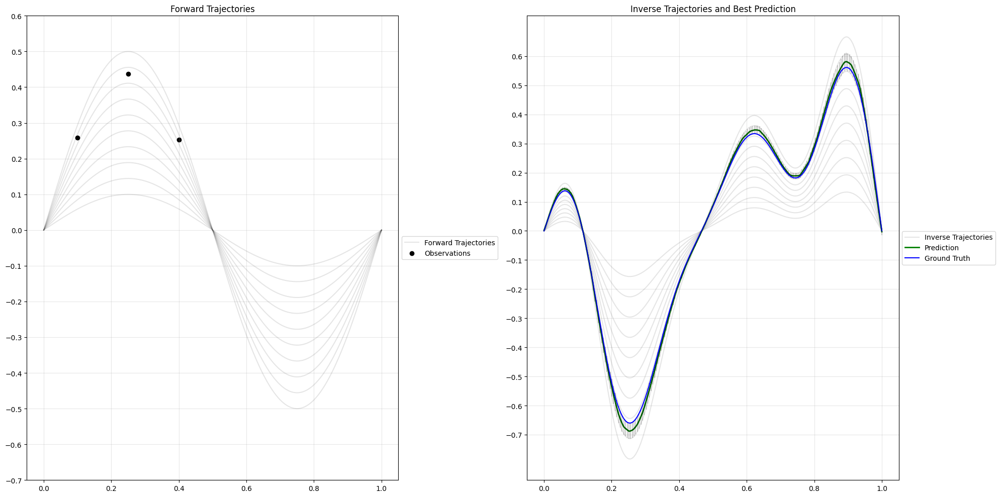

17


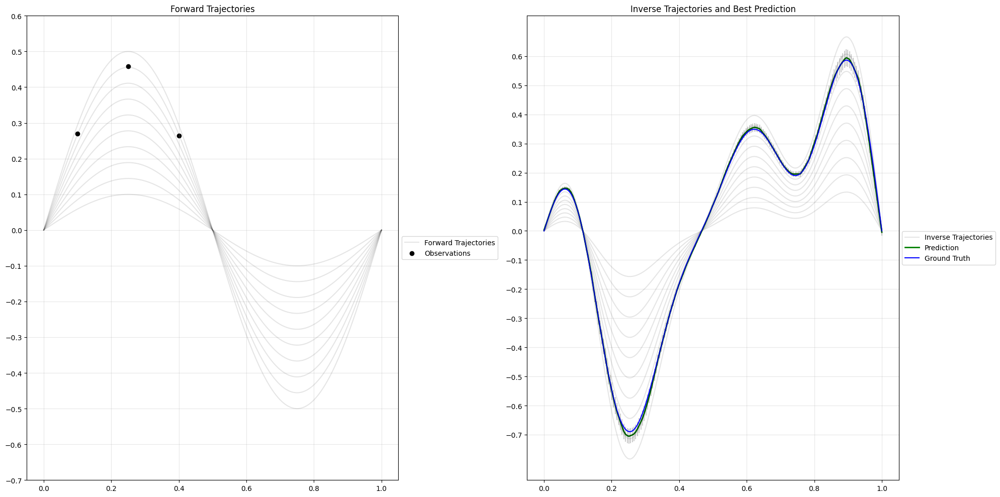

18


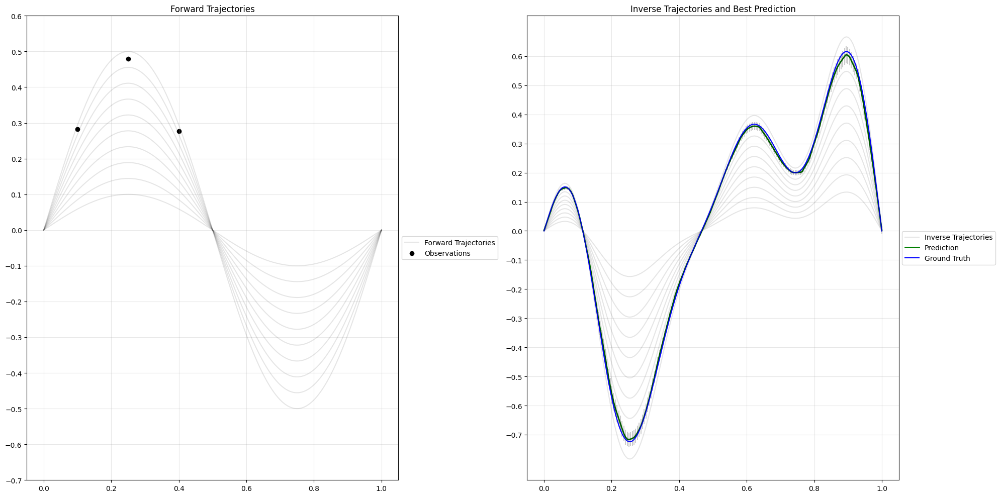

19


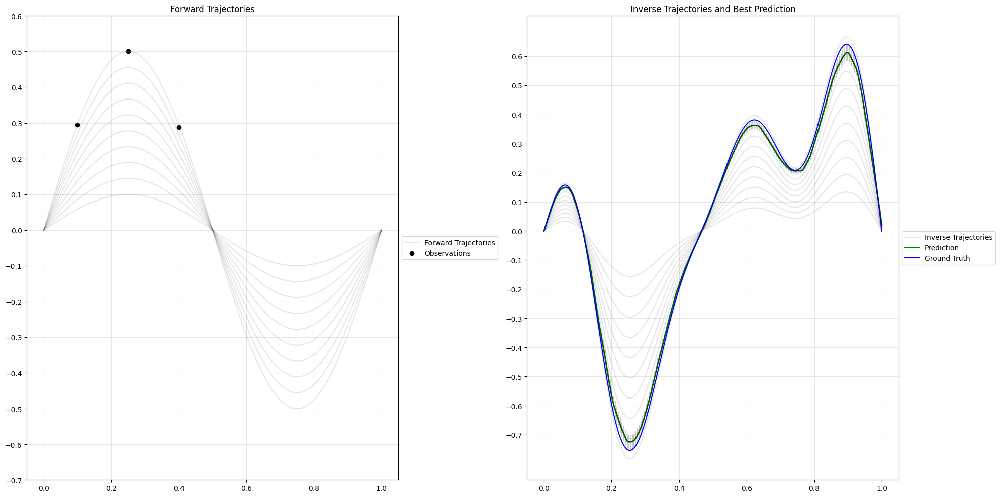

In [631]:
importlib.reload(dual_enc_dec_cnmp)
importlib.reload(utils)

def sinx(frequency, amplitude, phase):
    def dist(x):
        return amplitude * math.sin(2 * torch.pi * frequency * x + phase) # + torch.randn(1) * 0.05
    return dist

frequencies = [1, 1.75, 2.5]
amplitudes = np.linspace(0.1,0.5,128)
phases = [0]  # Example phases

t = [0.1, 0.25, 0.4]

_t = [int(__t * time_len) for __t in t]

min_y_f = torch.min(Y1[:, _t], dim=0).values
max_y_f = torch.max(Y1[:, _t], dim=0).values
interval_y_f = np.linspace(min_y_f, max_y_f, 20)

min_y_i = torch.min(Y2[:, _t], dim=0).values
max_y_i = torch.max(Y2[:, _t], dim=0).values
interval_y_i = np.linspace(min_y_i, max_y_i, 20)

# plot latent losses
#plt.plot(errors_with_latent)
#plt.show()


for i in range(len(interval_y_i)):
    condition_points = [[t[j], torch.tensor([interval_y_f[i, j]])] for j in range(len(t))]

    dist1 = sinx(frequencies[0], amplitudes[int(((i / 20)*128) % len(amplitudes))], phases[0])
    dist2 = sinx(2*frequencies[1], 0.3*amplitudes[int(((i / 20)*128) % len(amplitudes))], phases[0])
    dist3 = sinx(frequencies[2], 0.5*amplitudes[int(((i / 20)*128) % len(amplitudes))], phases[0])
    
    dist0 = lambda x: dist1(x) + dist2(x) + dist3(x)
    print(i)
    
    means, stds = dual_enc_dec_cnmp.predict_inverse(best_model, 1, time_len, condition_points, d_x, d_y1, d_y2, demo_data)
    utils.plot_results(means, stds, Y1, Y2, idx, condition_points, errors, losses, time_len, d_N, plot_errors = False, test_dist=[dist0, 0, 0])

In [ ]:
importlib.reload(dual_enc_dec_cnmp)
importlib.reload(utils)

def sinx(frequency, amplitude, phase):
    def dist(x):
        return amplitude * math.sin(2 * torch.pi * frequency * x + phase) # + torch.randn(1) * 0.05
    return dist

t = 0.25
min_y_f = torch.min(Y1[:, int(t * time_len)])
max_y_f = torch.max(Y1[:, int(t * time_len)])
interval_y_f = np.linspace(min_y_f, max_y_f, 200)

frequencies = [1]

NUM_OBS = 1000
amplitudes = np.linspace(0.5, 0.1, NUM_OBS)
    
phases = [0]  # Example phases

t = 0.25
min_y_f = torch.min(Y1[:, int(t * time_len)])
max_y_f = torch.max(Y1[:, int(t * time_len)])
interval_y_f = np.linspace(min_y_f, max_y_f, 5)

min_y_i = torch.min(Y2[:, int(t * time_len)])
max_y_i = torch.max(Y2[:, int(t * time_len)])
interval_y_i = torch.linspace(-0.5, -0.1, NUM_OBS)

# plot latent losses
#plt.plot(errors_with_latent)
#plt.show()

i = 0
mse_list = []
for i in range(len(interval_y_i)):
    condition_points = [[0.25, torch.tensor([interval_y_i[i]])]]
    means, stds = dual_enc_dec_cnmp.predict_forward(best_model, 1, time_len, condition_points, d_x, d_y1, d_y2, demo_data)
    dist = sinx(frequencies[i % len(frequencies)], amplitudes[i], phases[i % len(phases)])
    mse = F.mse_loss(means, torch.tensor([dist(t) for t in np.linspace(0, 1, time_len)]))
    mse_list.append(mse.item())

np.save("mse_0_nounpaired.npy", mse_list)
mse_paired = np.load("mse_0.npy")
plt.plot(interval_y_i, mse_paired, label='Unpaired Training')
plt.plot(interval_y_i, mse_list, label='Standard Training')
plt.grid(alpha=0.3)
plt.ylabel('MSE Loss')
plt.xlabel('Inverse Observation Position')
plt.vlines(-0.4, -1, 20, color='black', label='Min of Paired Data', linestyles='dashed')
plt.ylim(-0.00002, 0.0002)
plt.legend()
plt.xlim(-0.6, 0)
plt.show()

    

In [ ]:
importlib.reload(dual_enc_dec_cnmp)
importlib.reload(utils)

t = 0.25
min_y_f = torch.min(Y1[:, int(t * time_len)])
max_y_f = torch.max(Y1[:, int(t * time_len)])
interval_y_f = np.linspace(min_y_f, max_y_f, 20)

min_y_i = torch.min(Y2[:, int(t * time_len)])
max_y_i = torch.max(Y2[:, int(t * time_len)])
interval_y_i = torch.linspace(-0.5, -0.1, 20)

# plot latent losses
#plt.plot(errors_with_latent)
#plt.show()

i = 0
for i in range(len(interval_y_i)):
    condition_points = [[0.25, torch.tensor([interval_y_i[i]])]]
    means, stds = dual_enc_dec_cnmp.predict_inverse_inverse(best_model, 1, time_len, condition_points, d_x, d_y1, d_y2, demo_data)
    if i == 0:
        utils.plot_results_ii(means, stds, Y1, Y2, idx, condition_points, errors, losses, time_len, d_N, plot_errors = False)
    else:
        utils.plot_results_ii(means, stds, Y1, Y2, idx, condition_points, errors, losses, time_len, d_N, plot_errors = False)